In [2]:
from libraries import *
from parameters import *
from util import *

from pathlib import Path
from typing import List, Dict, Tuple
import warnings
warnings.filterwarnings('ignore')

# For cNMF
from cnmf import cNMF
import os

# For pathway enrichment
import gseapy as gp
from scipy import stats
import scipy.sparse as sp


/home/beraslan/miniconda/envs/py312/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
# a=sc.read_h5ad("/processed_datasets/VCI/ChemoGenetic_H1_Basak/AllControls_scaled_round2Only.h5ad")
# a = a[[x.count("|") == 1 for x in a.obs["assignment_geomux"]],:]
# a=a[~a.obs["assignment_geomux"].isin(["non-targeting_00632|non-targeting_01620",
#                                 "non-targeting_00167|non-targeting_00392",
#                                 "non-targeting_00811|non-targeting_01928",
#                                 "non-targeting_00081|non-targeting_03672",
#                                 "non-targeting_00707|non-targeting_00071",
#                                 "non-targeting_00210|non-targeting_02497",
#                                 "non-targeting_00539|non-targeting_03531"]),:]
# sc.pp.filter_cells(a, min_genes=500)

# sc.pp.neighbors(a, 
#             n_neighbors=5,
#             n_pcs=200)
# sc.tl.umap(a)

# import matplotlib.pyplot as plt

# fig, ax = plt.subplots(figsize=(11, 11))  # <-- controls size

# sc.pl.umap(
#     a,
#     color="sample",
#     legend_fontoutline=1,
#     legend_fontsize=12,
#     legend_fontweight="normal",
#     title="Drug conditions",
#     legend_loc="on data",
#     vmax=12000,
#     size=3,
#     ax=ax
# )
# plt.show()

In [ ]:
# a=sc.read_h5ad("/processed_datasets/VCI/ChemoGenetic_H1_Basak/AllControls_counts.h5ad")
# a = a[[x.count("|") == 1 for x in a.obs["assignment_geomux"]],:]
# a=a[~a.obs["assignment_geomux"].isin(["non-targeting_00632|non-targeting_01620",
#                                 "non-targeting_00167|non-targeting_00392",
#                                 "non-targeting_00811|non-targeting_01928",
#                                 "non-targeting_00081|non-targeting_03672",
#                                 "non-targeting_00707|non-targeting_00071",
#                                 "non-targeting_00210|non-targeting_02497",
#                                 "non-targeting_00539|non-targeting_03531"]),:]

# sc.pp.filter_genes(a, min_cells=1000)
# sc.pp.filter_cells(a, min_genes=500)

# rng = np.random.default_rng(45)

# idx_keep = []

# for drug, idx in a.obs.groupby('sample').indices.items():
#     idx = np.array(idx)
#     idx_sel = rng.choice(idx, size=3000, replace=False)
#     idx_keep.append(idx_sel)

# idx_keep = np.concatenate(idx_keep)
# a=a[idx_keep]

# a.obs['sample'].value_counts()

# counts_df = pd.DataFrame(
#         a.X.toarray() if hasattr(a.X, 'toarray') else a.X,
#         columns=a.var_names,
#         index=a.obs_names
#     )
# counts_df.to_csv("./../../TextFiles/nCNMF_matrix.csv", sep='\t')

In [2]:
cnmf_obj = cNMF(
    output_dir="./cnmf_analysis",
    name="drug_control_cnmf")
    

In [3]:
cnmf_obj.prepare(
    counts_fn="./../../TextFiles/nCNMF_matrix.csv",
    components=[6,8,10,12,14],
    n_iter=10,
    seed=1,
    num_highvar_genes=3000
)

In [4]:
cnmf_obj.factorize(
    worker_i=0,
    total_workers=1
)

[Worker 0]. Starting task 0.
[Worker 0]. Starting task 1.
[Worker 0]. Starting task 2.
[Worker 0]. Starting task 3.
[Worker 0]. Starting task 4.
[Worker 0]. Starting task 5.
[Worker 0]. Starting task 6.
[Worker 0]. Starting task 7.
[Worker 0]. Starting task 8.
[Worker 0]. Starting task 9.
[Worker 0]. Starting task 10.
[Worker 0]. Starting task 11.
[Worker 0]. Starting task 12.
[Worker 0]. Starting task 13.
[Worker 0]. Starting task 14.
[Worker 0]. Starting task 15.
[Worker 0]. Starting task 16.
[Worker 0]. Starting task 17.
[Worker 0]. Starting task 18.
[Worker 0]. Starting task 19.
[Worker 0]. Starting task 20.
[Worker 0]. Starting task 21.
[Worker 0]. Starting task 22.
[Worker 0]. Starting task 23.
[Worker 0]. Starting task 24.
[Worker 0]. Starting task 25.
[Worker 0]. Starting task 26.
[Worker 0]. Starting task 27.
[Worker 0]. Starting task 28.
[Worker 0]. Starting task 29.
[Worker 0]. Starting task 30.
[Worker 0]. Starting task 31.
[Worker 0]. Starting task 32.
[Worker 0]. Starting

In [5]:
cnmf_obj.combine()

Combining factorizations for k=6.
Combining factorizations for k=8.
Combining factorizations for k=10.
Combining factorizations for k=12.
Combining factorizations for k=14.


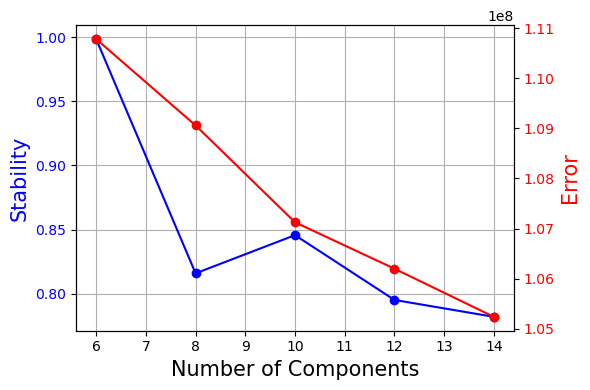

In [6]:
cnmf_obj.k_selection_plot(
    close_fig=False
)

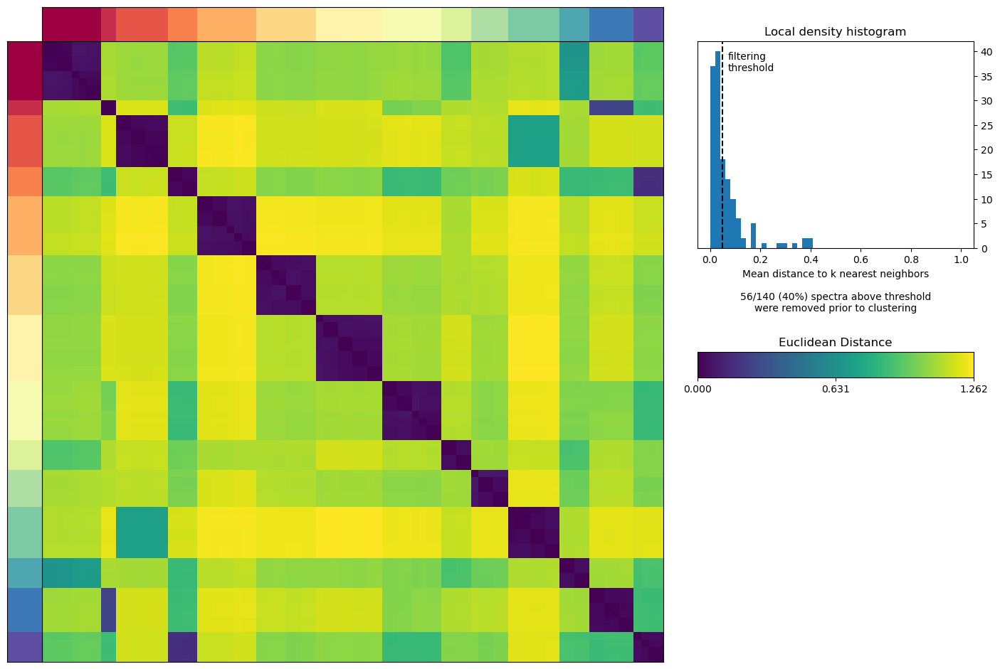

In [33]:
cnmf_obj.consensus(
    k=14,
    density_threshold=0.05,
    show_clustering=True,
    close_clustergram_fig=False
)

In [34]:
usage, spectra_scores, spectra_tpm, top_genes = cnmf_obj.load_results(K=14, density_threshold=0.05)


In [35]:
top_genes.columns=["Program_"+str(x)for x in top_genes.columns]

In [36]:
top_genes.to_csv("DrugPrograms_14.csv")

In [37]:
usage.to_csv("DrugProgramUsage_14.csv")

In [6]:
top_genes = pd.read_csv("DrugPrograms_14.csv", index_col=0)

In [7]:
top_genes

,Program_1,Program_2,Program_3,Program_4,Program_5,Program_6,Program_7,Program_8,Program_9,Program_10,Program_11,Program_12,Program_13,Program_14
0,VSNL1,USP9X,H1-5,FAM162A,CDK1,DHRS2,DNAJC15,CDX2,USP9X,CUZD1,EPS8L2,CCN1,FZD5,STOM
1,THY1,PODXL,H2BC9,EGLN1,TOP2A,H2AC6,NKD1,EVX1,AASS,ACOXL,ALDH1A3,THBS1,LMO1,TFAP2A
2,SEPHS1,ZFAND5,H1-2,SLC2A1,KIF23,CSRP1,COL1A2,PLXNA2,CD24,CAMK2N1,MDM2,WEE1,LHX5,PKDCC
3,PHC1,APELA,H1-3,IGFBP2,HJURP,H2AC25,SAT1,PPP1R14C,SERPINB9,PAPLN,BBC3,NUAK2,SIX3,FRZB
4,SLC39A14,CD24,H4C3,INSIG2,PLK1,MYOCD,TRDC,VWA2,PLS3,GALNT9,ZMAT3,ACTG1,HESX1,HAPLN1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,TNIK,ZFP36L2,CENPM,BPNT2,FOXM1,RAB13,CRYZ,SLCO2A1,GNPTAB,DDIT4,ITIH5,FHL3,IRX1,CACNG4
96,SEC24D,AKIRIN1,DEK,KDM2B,PRR11,ASF1A,FBLN1,HOXC6,TERF1,MYF6,PRAP1,JUN,CHD9NB,LPAR1
97,MOB4,SENP2,CHEK1,P3H2,CIT,FRMD4A,SPIN4,PRSS23,C1GALT1,PKNOX2,GALNT11,FGF2,BARHL1,CNTNAP2
98,APP,USP44,SESN2,NCKIPSD,NCAPH,GOT2,TCF4,RCN1,DBP,PIK3CD,TFRC,SQSTM1,MAF,TMPRSS13


In [8]:
a=sc.read_h5ad("/processed_datasets/VCI/ChemoGenetic_H1_Basak/AllControls_scaled_round2Only.h5ad")
a = a[[x.count("|") == 1 for x in a.obs["assignment_geomux"]],:]
a=a[~a.obs["assignment_geomux"].isin(["non-targeting_00632|non-targeting_01620",
                                "non-targeting_00167|non-targeting_00392",
                                "non-targeting_00811|non-targeting_01928",
                                "non-targeting_00081|non-targeting_03672",
                                "non-targeting_00707|non-targeting_00071",
                                "non-targeting_00210|non-targeting_02497",
                                "non-targeting_00539|non-targeting_03531"]),:]
sc.pp.filter_cells(a, min_genes=500)

sc.pp.neighbors(a, 
            n_neighbors=5,
            n_pcs=200)
sc.tl.umap(a)


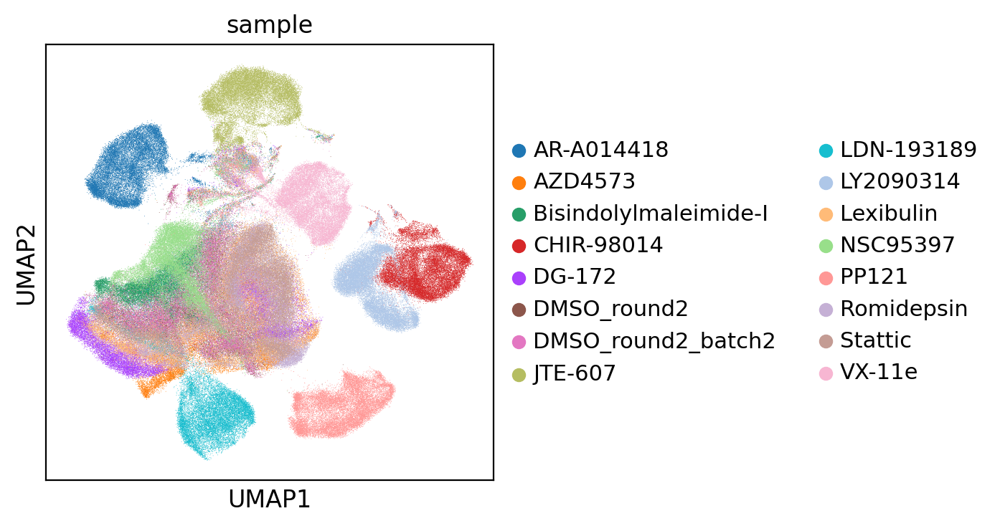

In [9]:
sc.pl.umap(a, color="sample")

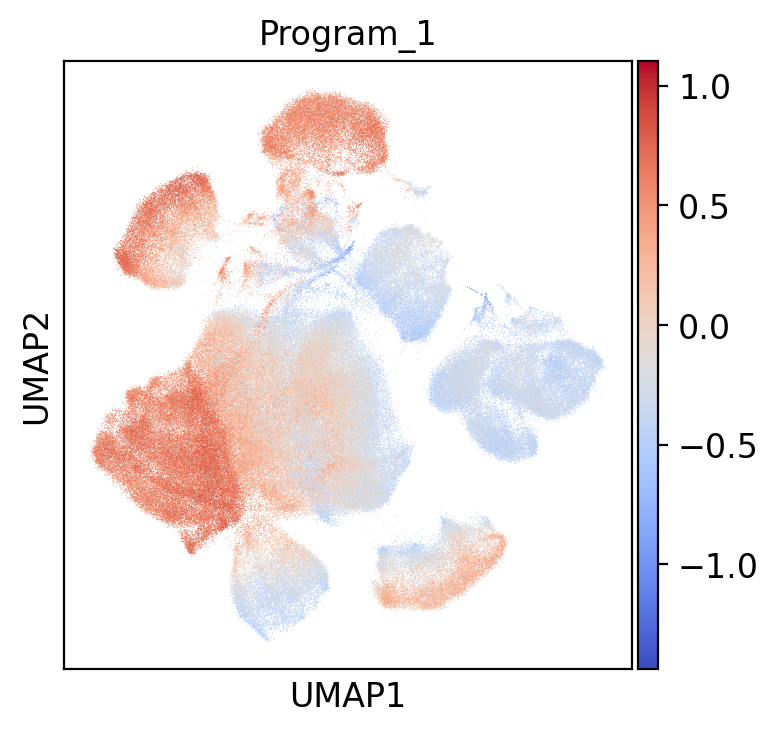

genes are not in var_names and ignored: Index(['bfp'], dtype='object')


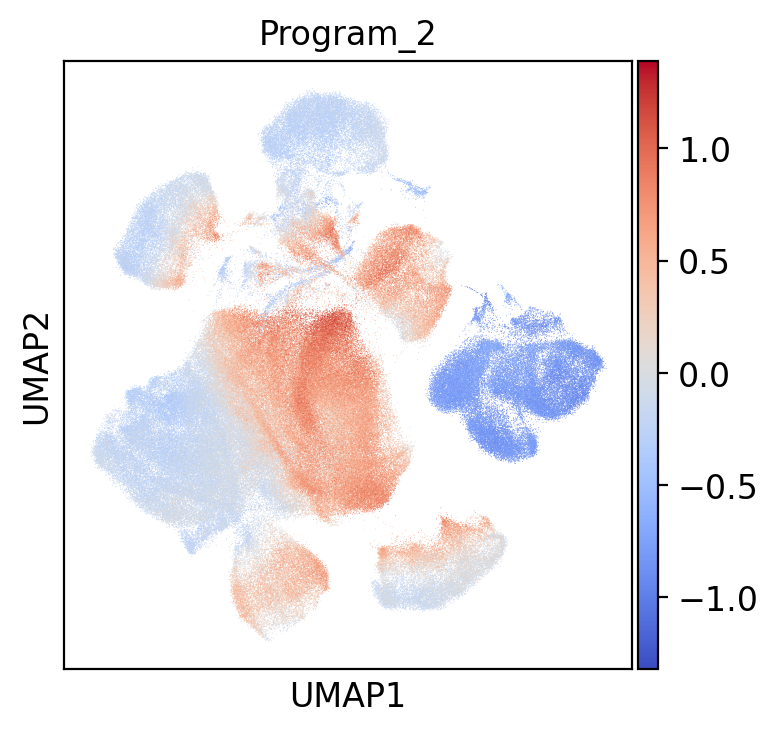

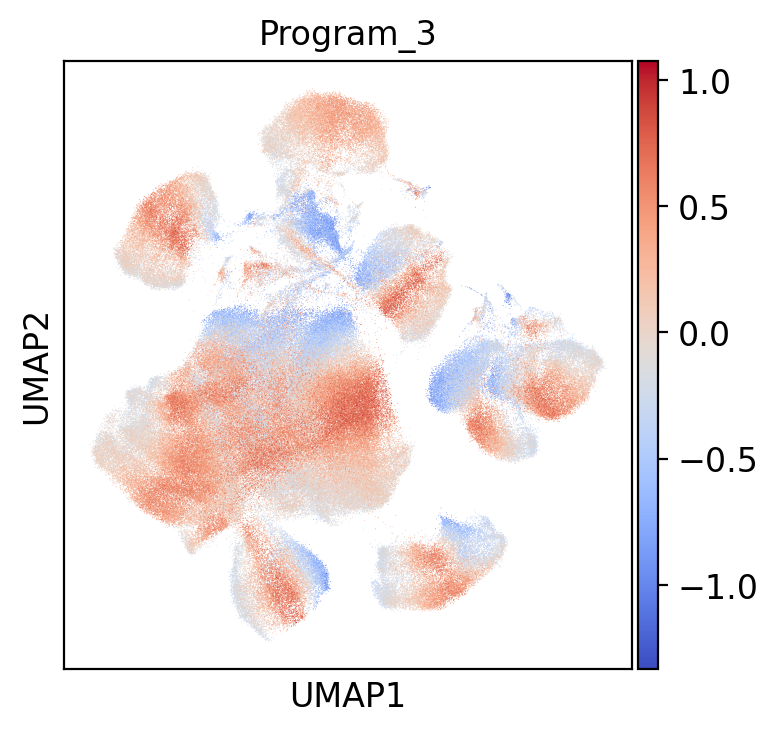

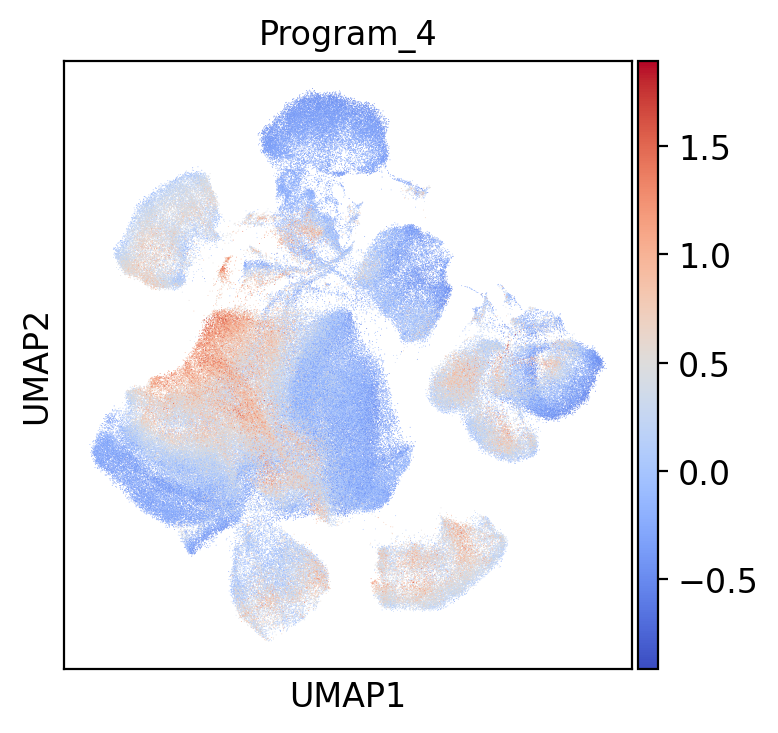

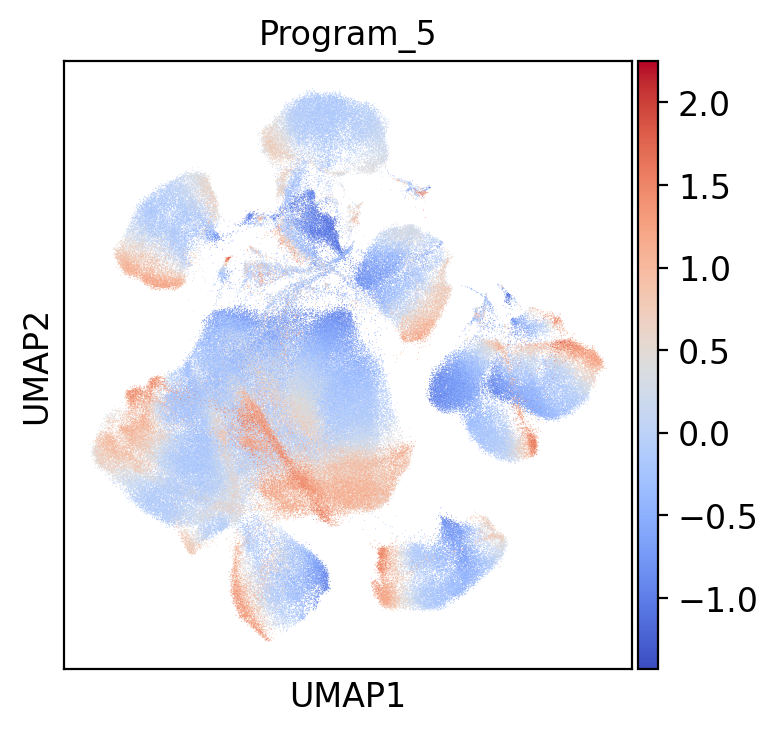

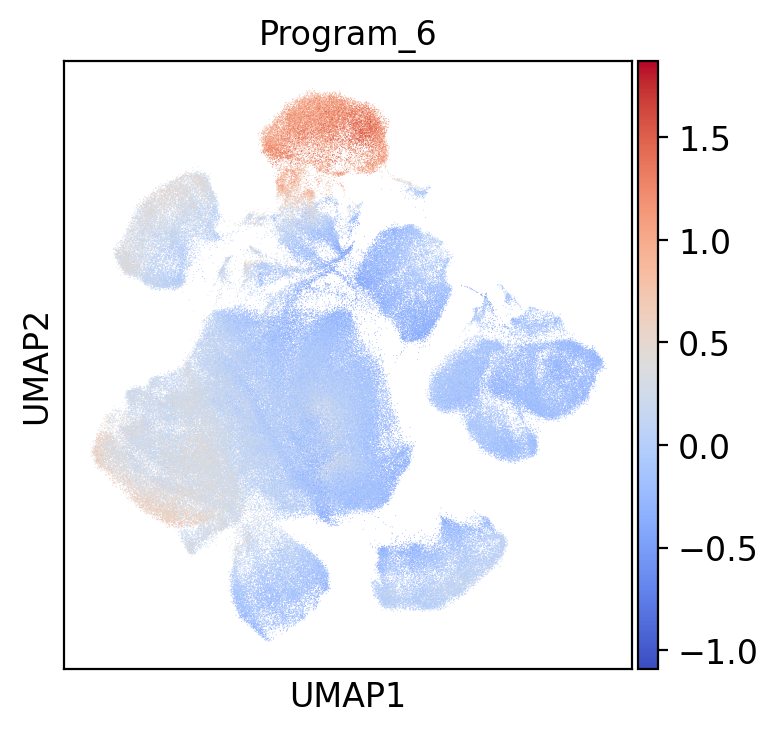

...

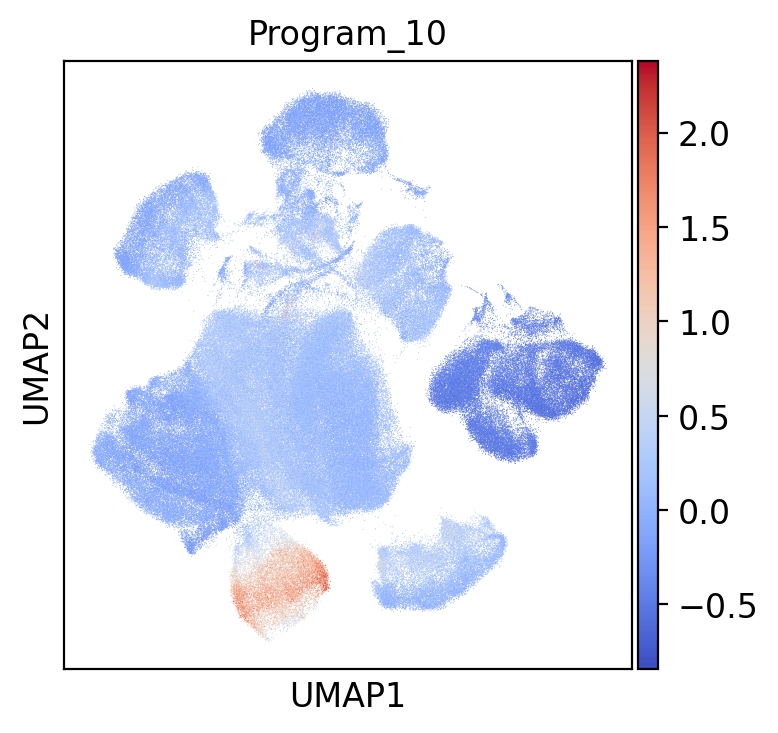

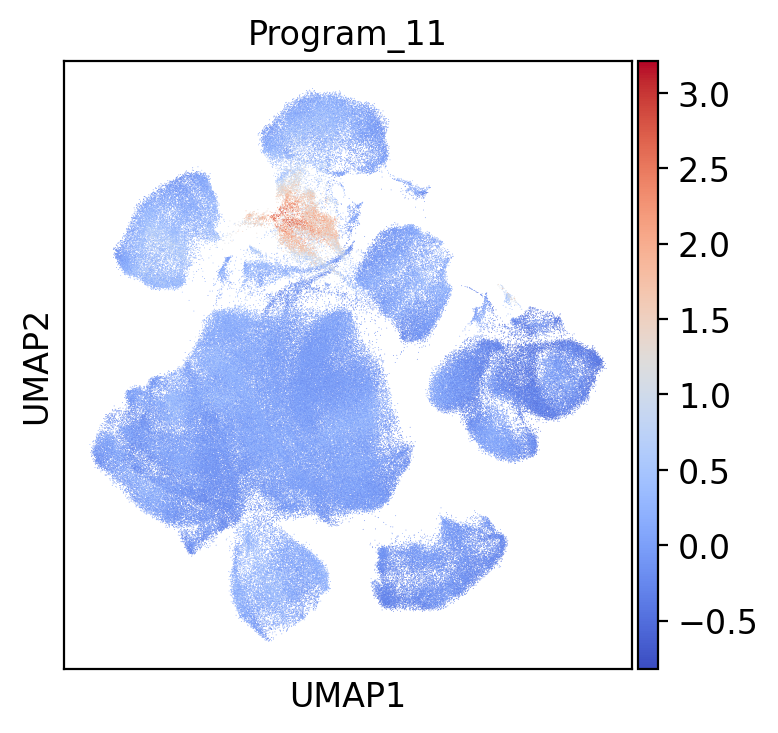

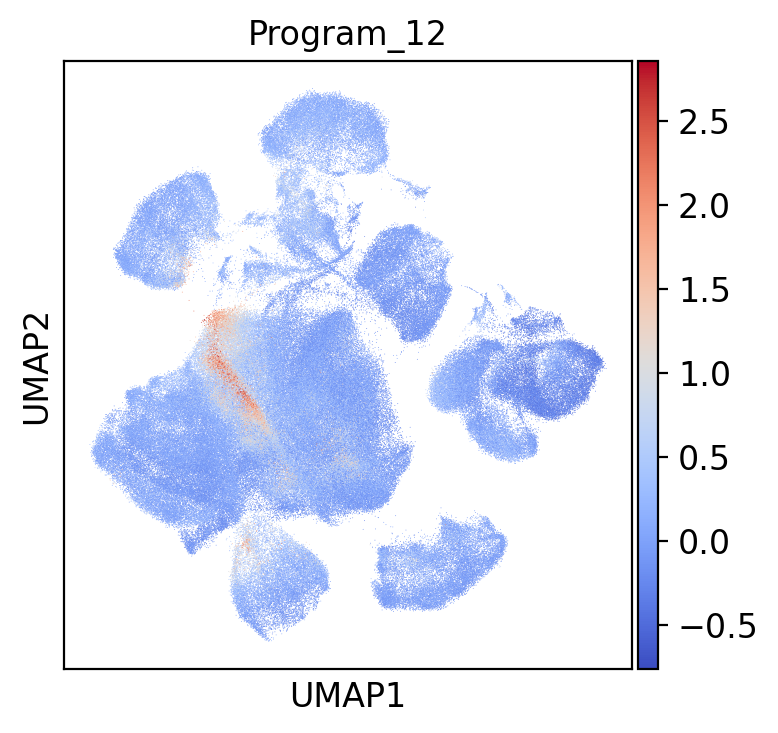

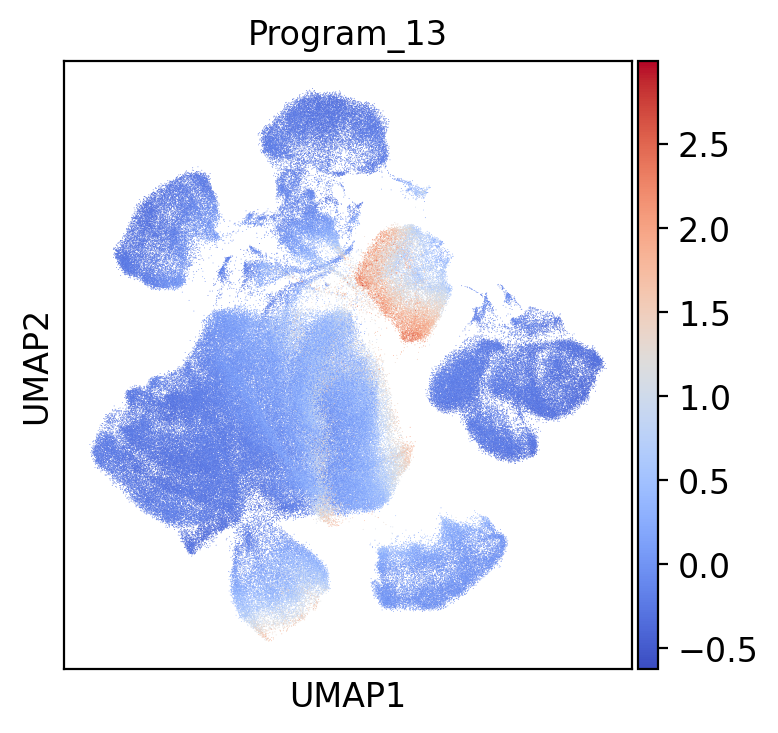

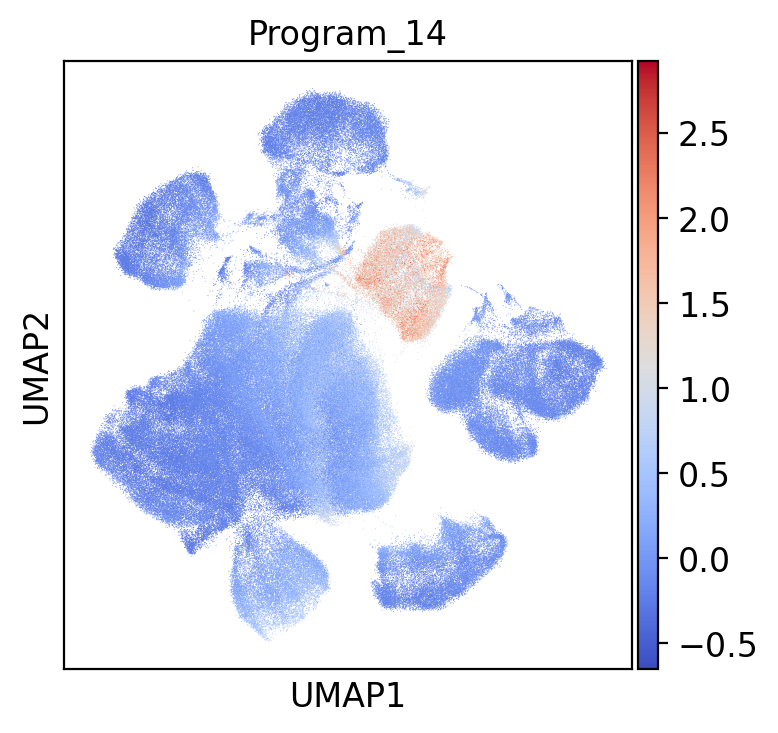

In [10]:
for prog_name in top_genes.columns:
    genes = top_genes[prog_name].dropna().astype(str).tolist()

   
    sc.tl.score_genes(
            a,
            gene_list=genes,
            score_name=prog_name)
    sc.pl.umap(a, color=prog_name, cmap='coolwarm')


In [11]:
gene_list_url = 'https://raw.githubusercontent.com/theislab/scanpy_usage/master/180209_cell_cycle/data/regev_lab_cell_cycle_genes.txt'

cell_cycle_genes = [x.strip().decode('utf-8').upper() for x in urlopen(gene_list_url)]


s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]


sc.tl.score_genes_cell_cycle(a, s_genes=s_genes, g2m_genes=g2m_genes)


genes are not in var_names and ignored: Index(['MLF1IP'], dtype='object')
genes are not in var_names and ignored: Index(['FAM64A', 'HN1'], dtype='object')


In [12]:
# Define program columns
program_cols = [f"Program_{i}" for i in range(1, 15)]

# Compute median per sample
median_df = (
    a.obs
    .groupby("sample")[program_cols]
    .median()
)

In [19]:
median_df

,Program_1,Program_2,Program_3,Program_4,Program_5,Program_6,Program_7,Program_8,Program_9,Program_10,Program_11,Program_12,Program_13,Program_14
sample,,,,,,,,,,,,,,
AR-A014418,0.404849,-0.146946,0.108480,0.306650,0.050313,0.165766,-0.260531,-0.241899,-0.138519,-0.072712,0.156112,0.030383,-0.236428,-0.224986
AZD4573,-0.007512,0.241438,0.136040,-0.260569,-0.035935,-0.083359,-0.319336,-0.316704,0.140574,-0.069344,-0.143442,-0.172778,-0.120575,-0.113366
Bisindolylmaleimide-I,0.304615,-0.144045,0.006097,0.301076,-0.228288,0.059488,-0.231691,-0.259906,-0.121296,-0.042526,0.002170,0.098865,-0.207161,-0.193441
CHIR-98014,-0.419021,-0.881434,-0.007812,-0.197565,-0.261774,-0.283550,1.399228,2.002640,-0.945485,-0.557108,-0.355278,-0.328494,-0.307420,-0.195655
DG-172,0.333226,-0.031651,0.133126,-0.329114,0.037470,0.209593,-0.274702,-0.292304,0.021114,-0.076719,-0.060614,0.010024,-0.156085,-0.127577
DMSO_round2,0.030985,0.133069,-0.006495,0.305814,-0.109075,-0.079010,-0.269211,-0.281220,0.075076,-0.003057,-0.091870,-0.021326,-0.128744,-0.106402
DMSO_round2_batch2,0.038111,0.131002,-0.013680,0.345125,-0.106960,-0.045654,-0.260133,-0.272078,0.135426,0.016680,-0.090044,-0.013954,-0.109014,-0.084823
JTE-607,0.508714,-0.285326,0.159203,-0.369285,-0.124117,1.041246,-0.195683,-0.260930,-0.221554,-0.182866,0.093385,0.064901,-0.266671,-0.220455
LDN-193189,-0.249340,0.251408,-0.006300,0.157114,-0.177945,-0.134472,-0.254761,-0.286444,0.221613,1.015424,0.054951,0.035388,0.235845,0.095588


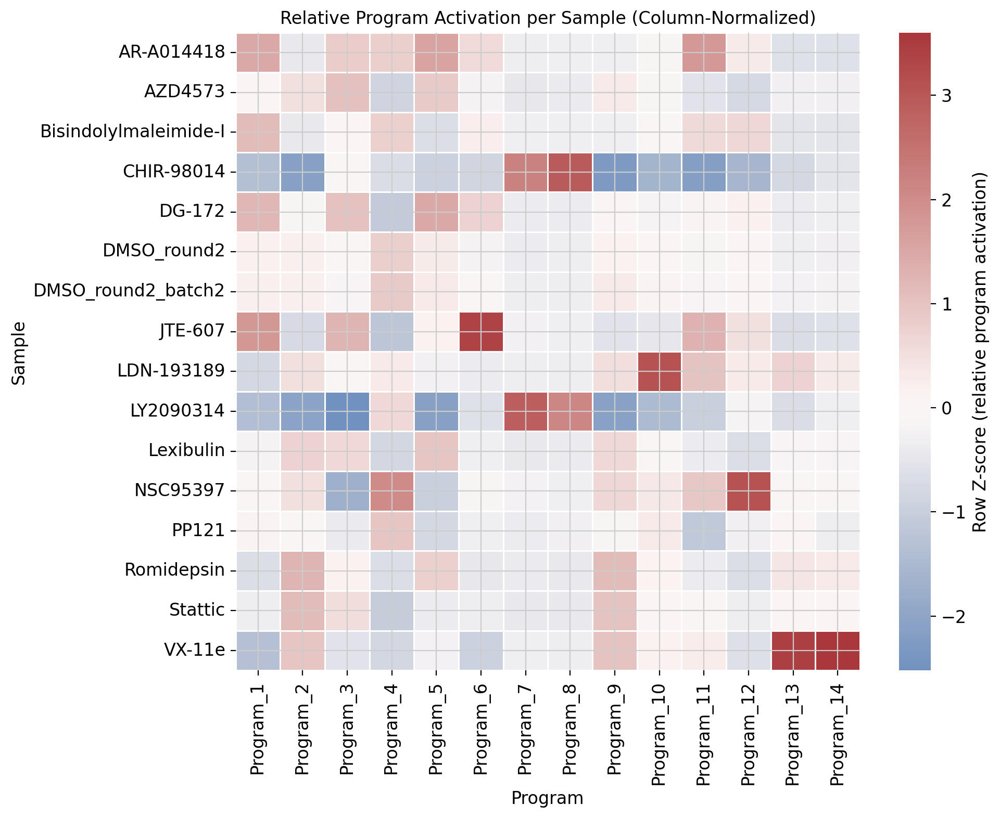

In [28]:
col_scaled = median_df.sub(median_df.mean(axis=0), axis=1)
col_scaled = col_scaled.div(median_df.std(axis=0).replace(0, np.nan), axis=1)

plt.figure(figsize=(10, 8))
sns.heatmap(
    col_scaled,
    cmap="vlag",
    center=0,
    linewidths=0.5,
    linecolor="white",
    cbar_kws={"label": "Row Z-score (relative program activation)"}
)

plt.xlabel("Program")
plt.ylabel("Sample")
plt.title("Relative Program Activation per Sample (Column-Normalized)")
plt.tight_layout()
plt.show()

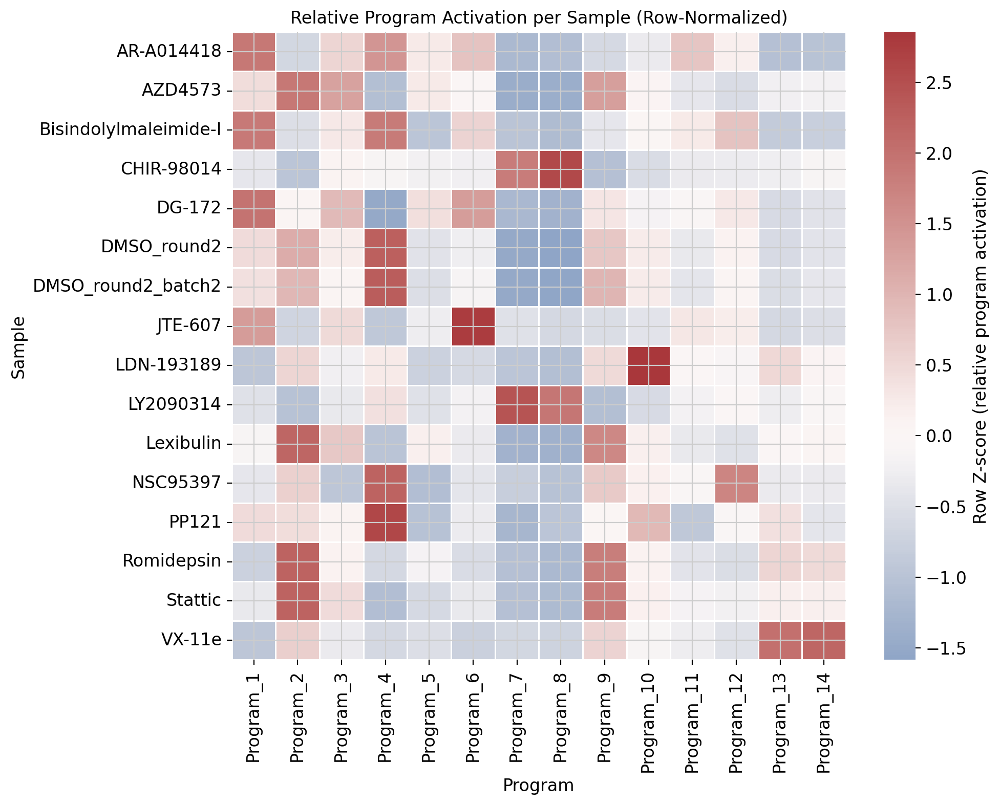

In [56]:

# Row-wise z-score normalization
row_scaled = median_df.sub(median_df.mean(axis=1), axis=0)
row_scaled = row_scaled.div(median_df.std(axis=1).replace(0, np.nan), axis=0)

plt.figure(figsize=(10, 8))
sns.heatmap(
    row_scaled,
    cmap="vlag",
    center=0,
    linewidths=0.5,
    linecolor="white",
    cbar_kws={"label": "Row Z-score (relative program activation)"}
)

plt.xlabel("Program")
plt.ylabel("Sample")
plt.title("Relative Program Activation per Sample (Row-Normalized)")
plt.tight_layout()
plt.show()

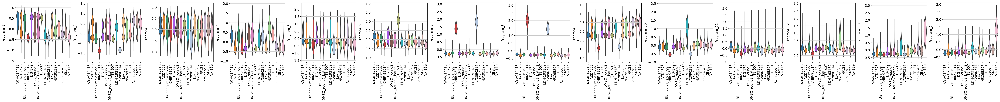

In [50]:
import scanpy as sc

program_cols = [f"Program_{i}" for i in range(1, 15)]

sc.pl.violin(
    a,
    keys=program_cols,
    groupby="sample",
    rotation=90,
    stripplot=False,
    multi_panel=True,
    scale="width",   # comparable widths
)

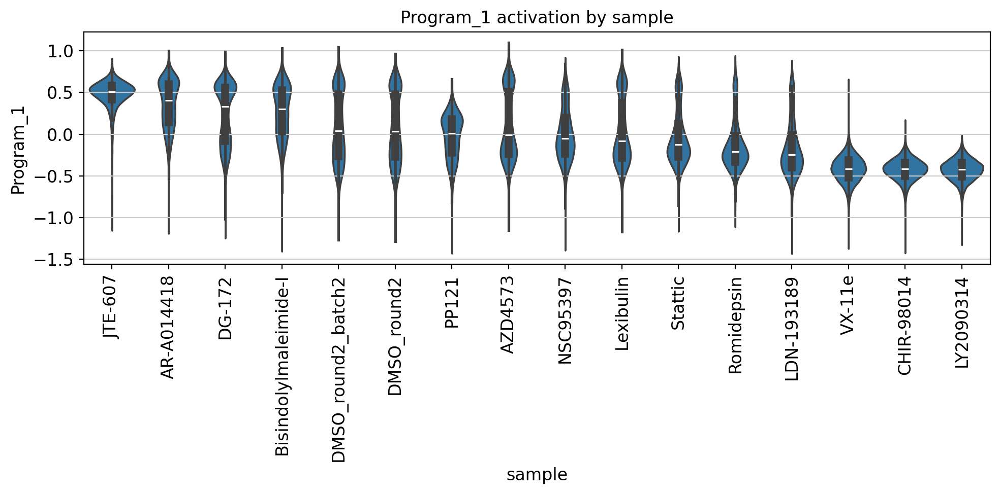

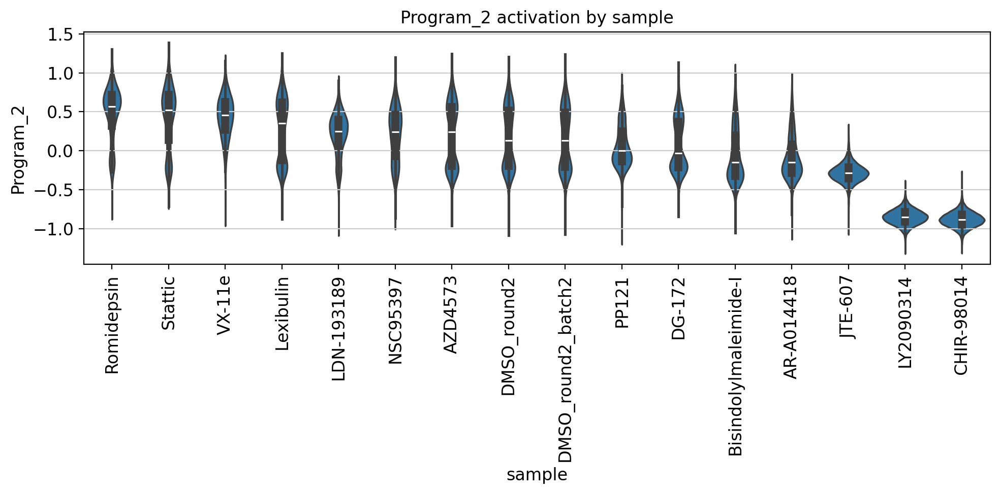

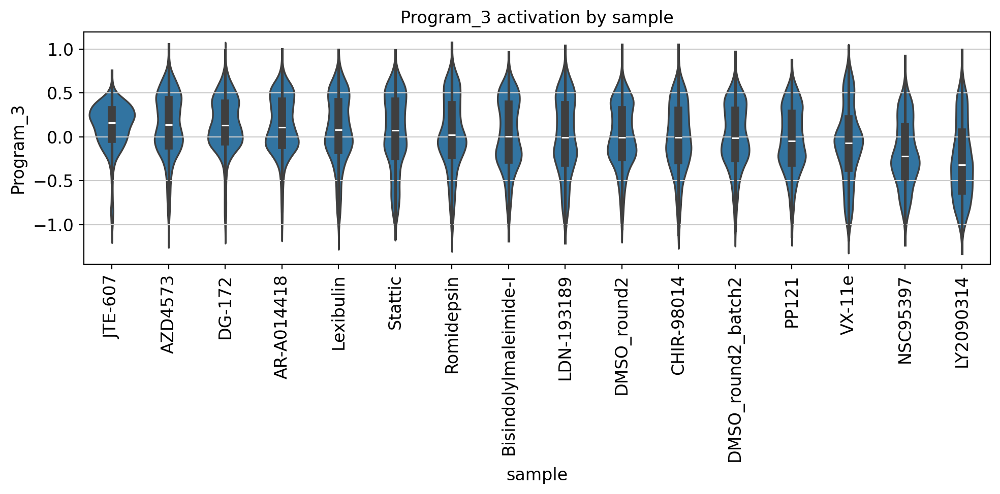

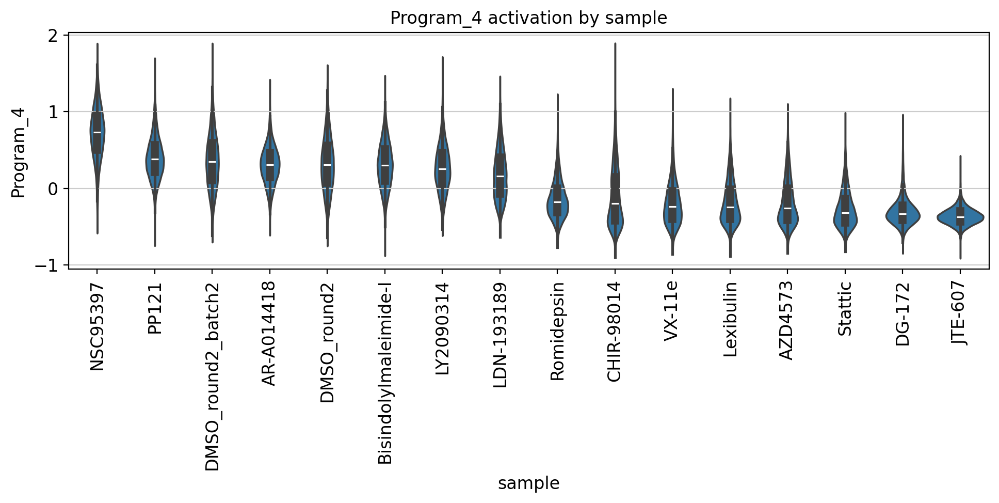

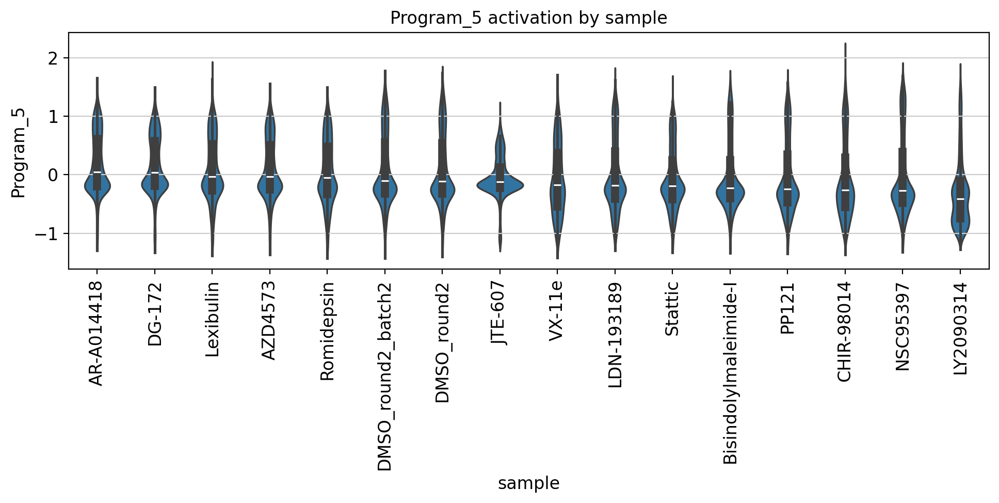

...

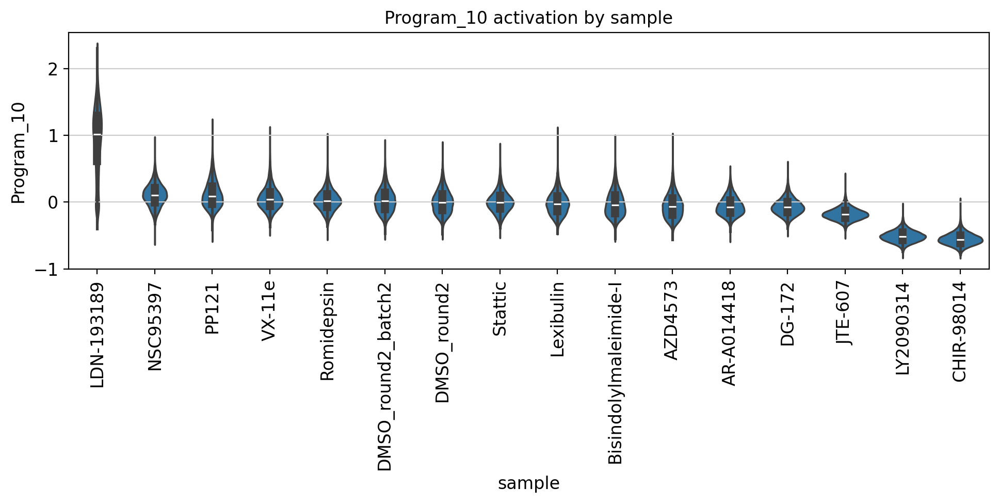

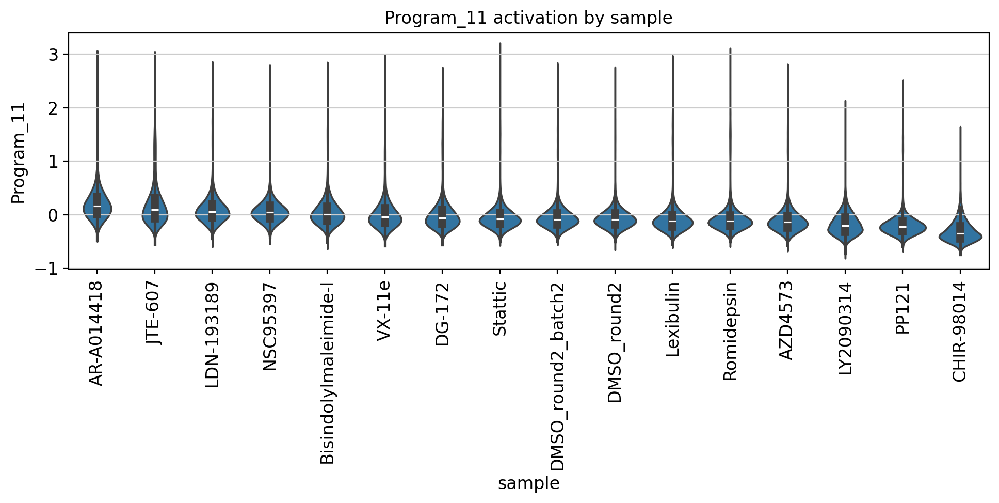

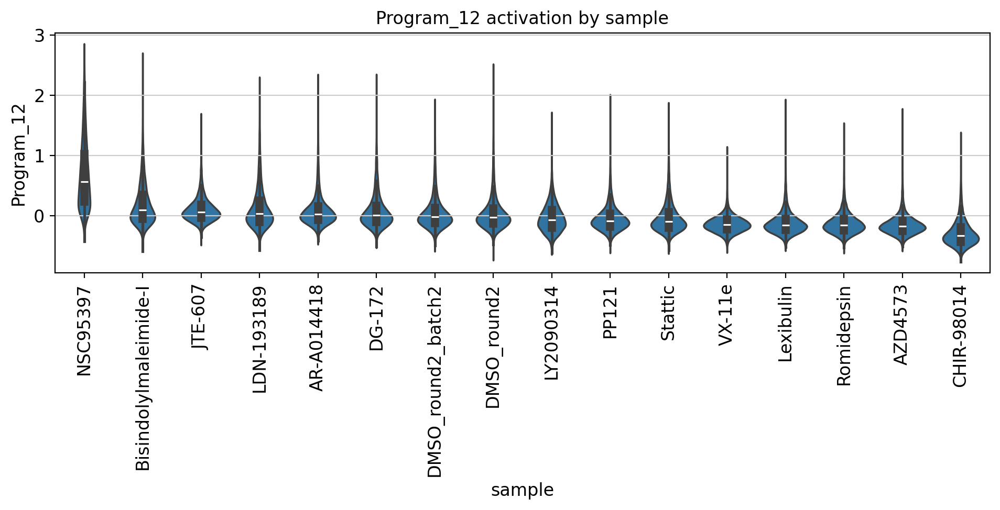

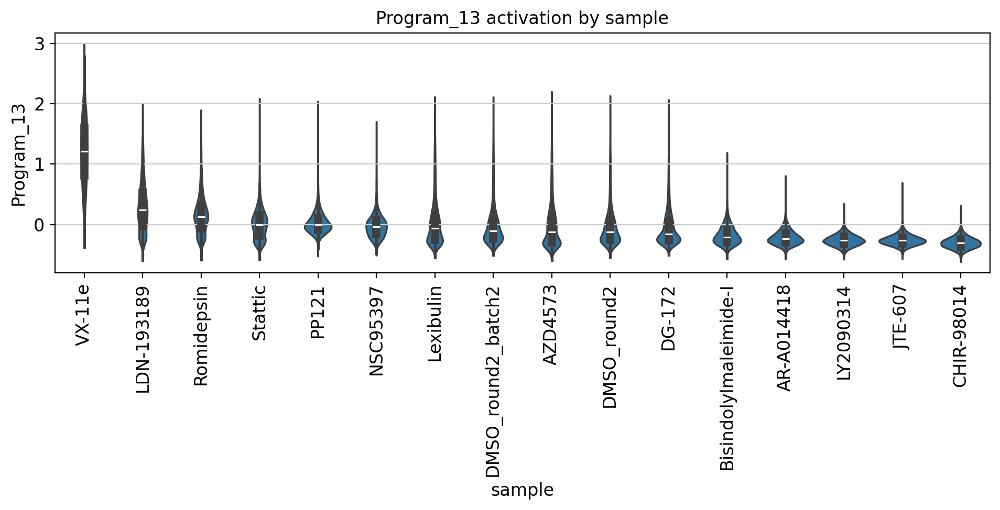

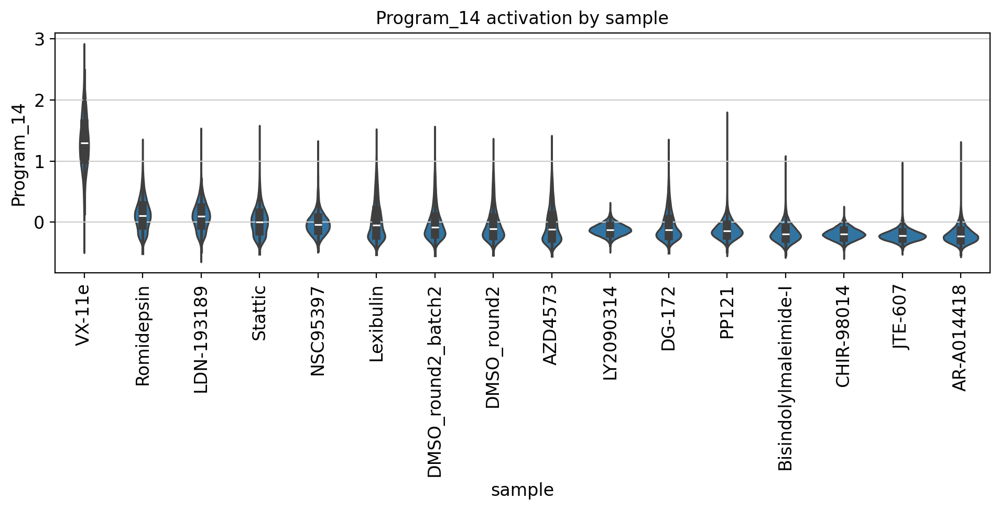

In [52]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

program_cols = [f"Program_{i}" for i in range(1, 15)]

for prog in program_cols:
    plt.figure(figsize=(10, 5))
    
    # Compute ordering by median
    medians = (
        a.obs
        .groupby("sample")[prog]
        .median()
        .sort_values(ascending=False)
    )
    order = medians.index.tolist()

    sns.violinplot(
        data=a.obs,
        x="sample",
        y=prog,
        order=order,
        inner="box",     # overlay boxplot
        cut=0,
    )
    
    plt.xticks(rotation=90)
    plt.title(f"{prog} activation by sample")
    plt.tight_layout()
    plt.show()

In [22]:
import numpy as np
import pandas as pd
import scanpy as sc
from statsmodels.stats.multitest import multipletests
from scipy.stats import mannwhitneyu


def score_programs_from_df(
    adata: sc.AnnData,
    programs_df: pd.DataFrame,
    gene_symbol_key: str | None = None,   # e.g. "gene_symbol" if adata.var has symbols
    score_prefix: str = "prog",
    use_scanpy_score_genes: bool = True,
    layer: str | None = None,            # e.g. "log1p" or None for adata.X
    ctrl_size: int = 50,
    n_bins: int = 25,
):
    """
    programs_df: each column is a program; entries are gene names (NaNs allowed).
    Adds program scores to adata.obs as {score_prefix}_{program_name}_score.
    Returns: list of score column names, dict program->genes_used
    """
    # Build a set of available gene names
    if gene_symbol_key is None:
        available = set(map(str, adata.var_names))
        def map_gene(g): return str(g)
    else:
        if gene_symbol_key not in adata.var.columns:
            raise ValueError(f"{gene_symbol_key!r} not found in adata.var")
        sym = adata.var[gene_symbol_key].astype(str)
        # Map symbol -> var_name (handle duplicates by first occurrence)
        sym2var = {}
        for var_name, s in zip(adata.var_names, sym):
            if s not in sym2var:
                sym2var[s] = var_name
        available = set(sym2var.keys())
        def map_gene(g): return sym2var.get(str(g), None)

    score_cols = []
    genes_used = {}

    for prog_name in programs_df.columns:
        genes = programs_df[prog_name].dropna().astype(str).tolist()

        if gene_symbol_key is None:
            genes_in = [g for g in genes if g in available]
            gene_list_for_scoring = genes_in
        else:
            mapped = [map_gene(g) for g in genes]
            gene_list_for_scoring = [m for m in mapped if m is not None]

        if len(gene_list_for_scoring) < 3:
            # Too few genes to score robustly; skip
            continue

        score_col = f"{score_prefix}_{prog_name}_score"
        genes_used[prog_name] = gene_list_for_scoring
        score_cols.append(score_col)

        if use_scanpy_score_genes:
            sc.tl.score_genes(
                adata,
                gene_list=gene_list_for_scoring,
                score_name=score_col,
                ctrl_size=ctrl_size,
                n_bins=n_bins,
                use_raw=False,
                layer=layer,
            )
        else:
            # Simple mean expression score (works if adata.X/layer is already comparable across genes)
            X = adata.layers[layer] if layer is not None else adata.X
            idx = [adata.var_names.get_loc(g) for g in gene_list_for_scoring]
            if hasattr(X, "tocsc"):
                Xsub = X[:, idx].tocsc()
                adata.obs[score_col] = np.asarray(Xsub.mean(axis=1)).ravel()
            else:
                adata.obs[score_col] = np.asarray(X[:, idx]).mean(axis=1)

    return score_cols, genes_used


def plot_program_umaps(
    adata: sc.AnnData,
    score_cols: list[str],
    ncols: int = 3,
    cmap: str = "viridis",
):
    """
    Plots UMAP for each program score in score_cols.
    """
    sc.pl.umap(
        adata,
        color=score_cols,
        ncols=ncols,
        cmap=cmap,
        frameon=False,
    )


def test_program_activation_by_context(
    adata: sc.AnnData,
    score_cols: list[str],
    context_col: str,
    min_cells_per_context: int = 20,
    alternative: str = "greater",   # "greater" = context higher than rest
    method: str = "mannwhitney",    # robust default
):
    """
    For each (program, context), test whether scores in that context are higher than all other cells.
    Uses Mann-Whitney U (one-sided by default) + BH FDR correction per program.

    Returns a tidy DataFrame with:
      program, context, n_in, n_out, effect_median_diff, pval, qval
    """
    if context_col not in adata.obs:
        raise ValueError(f"{context_col!r} not found in adata.obs")

    ctx = adata.obs[context_col].astype("category")
    results = []

    for sc_col in score_cols:
        if sc_col not in adata.obs:
            continue
        scores = adata.obs[sc_col].to_numpy()

        pvals = []
        rows = []

        for c in ctx.cat.categories:
            mask_in = (ctx == c).to_numpy()
            n_in = int(mask_in.sum())
            if n_in < min_cells_per_context:
                continue

            mask_out = ~mask_in
            n_out = int(mask_out.sum())
            if n_out < min_cells_per_context:
                continue

            x_in = scores[mask_in]
            x_out = scores[mask_out]

            # Effect size: median difference (context - rest)
            eff = float(np.nanmedian(x_in) - np.nanmedian(x_out))

            if method == "mannwhitney":
                # Mann-Whitney U: nonparametric, robust
                # Note: mannwhitneyu expects finite values
                x_in2 = x_in[np.isfinite(x_in)]
                x_out2 = x_out[np.isfinite(x_out)]
                if len(x_in2) < min_cells_per_context or len(x_out2) < min_cells_per_context:
                    continue
                stat, p = mannwhitneyu(x_in2, x_out2, alternative=alternative)
                p = float(p)
            else:
                raise ValueError("method must be 'mannwhitney'")

            rows.append((sc_col, str(c), n_in, n_out, eff, p))
            pvals.append(p)

        if not rows:
            continue

        # BH correction across contexts for this program
        _, qvals, _, _ = multipletests(pvals, method="fdr_bh")

        for (sc_col, c, n_in, n_out, eff, p), q in zip(rows, qvals):
            results.append({
                "program_score": sc_col,
                "program": sc_col.replace("_score", ""),
                "context": c,
                "n_in": n_in,
                "n_out": n_out,
                "median_diff_in_minus_out": eff,
                "pval": p,
                "qval": float(q),
            })

    res_df = pd.DataFrame(results)
    if len(res_df):
        res_df = res_df.sort_values(["program_score", "qval", "pval"]).reset_index(drop=True)
    return res_df

AnnData object with n_obs × n_vars = 303483 × 18151
    obs: 'sample', 'experiment', 'lane_id', 'bc_idx', 'assignment_geomux', 'umis_geomux', 'moi_geomux', 'n_reads_gex', 'n_reads_crispr', 'n_umis_gex', 'n_umis_crispr', 'cell', 'moi_mixture', 'assignment_mixture', 'umis_mixture', 'assignment', 'moi', 'umis', 'batch', 'target_gene', 'target_gene_name', 'target_guide_umi', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'source_file', 'source_basename', 'n_genes'
    var: 'mt', 'ribo', 'mean', 'std'
    uns: 'pca', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [ ]:
spectra_tpm.shape

In [ ]:
gene_names = a.var_names
spectra_scores.columns = gene_names
spectra_tpm.columns = gene_names

In [ ]:
def run_cnmf_analysis(
    counts_path: Path,
    output_dir: str = "./cnmf_analysis",
    name: str = "drug_control_cnmf",
    k_range: List[int] = [5, 6, 7, 8, 9, 10, 12, 14, 16, 18, 20],
    n_iter: int = 100,
    seed: int = 14,
    n_top_genes: int = 100,
    num_highvar_genes: int = None,
    verbose: bool = True
):
    """
    Run cNMF to identify gene programs.
    
    Parameters:
    -----------
    counts_path : Path
        Path to counts matrix file
    output_dir : str
        Output directory
    name : str
        Name for this cNMF run
    k_range : list
        Range of K values (number of programs) to test
    n_iter : int
        Number of NMF iterations
    seed : int
        Random seed
    n_top_genes : int
        Number of top genes to extract per program
    num_highvar_genes : int or None
        Number of highly variable genes to use (None = use all)
    verbose : bool
        Print progress
    
    Returns:
    --------
    cnmf_obj : cNMF
        Fitted cNMF object
    """
    
    output_dir = Path(output_dir)
    
    if verbose:
        print("\n" + "="*60)
        print("RUNNING cNMF ANALYSIS")
        print("="*60)
    
    # Initialize cNMF object
    cnmf_obj = cNMF(
        output_dir=str(output_dir),
        name=name
    )
    
    if verbose:
        print(f"\nInitializing cNMF:")
        print(f"  Output directory: {output_dir}")
        print(f"  Run name: {name}")
        print(f"  K range: {k_range}")
        print(f"  Iterations: {n_iter}")
    
    # Prepare the data
    if verbose:
        print("\nStep 1: Preparing data...")
    
    cnmf_obj.prepare(
        counts_fn=str(counts_path),
        components=k_range,
        n_iter=n_iter,
        seed=seed,
        num_highvar_genes=num_highvar_genes
    )
    
    # Factorize
    if verbose:
        print("\nStep 2: Running NMF factorization...")
        print("  This may take a while...")
    
    cnmf_obj.factorize(
        worker_i=0,
        total_workers=1
    )
    
    # Combine results
    if verbose:
        print("\nStep 3: Combining results across iterations...")
    
    cnmf_obj.combine()
    
    # K selection
    if verbose:
        print("\nStep 4: Computing K selection metrics...")
    
    cnmf_obj.k_selection_plot(
        close_fig=False
    )
    
    if verbose:
        print(f"\n✓ K selection plot saved")
        print("\nReview the K selection plot to choose optimal K")
        print("Then run consensus() with your chosen K")
    
    return cnmf_obj

cnmf_obj = run_cnmf_analysis(
        counts_path="./TextFiles/nCNMF_matrix.csv",
        n_iter=100)

In [ ]:
cnmf_obj

In [ ]:


# ============================================================
# 2. RUN cNMF
# ============================================================


def run_cnmf_consensus(
    cnmf_obj,
    selected_k: int,
    density_threshold: float = 0.1,
    n_top_genes: int = 100,
    verbose: bool = True
):
    """
    Run consensus step with selected K.
    
    Parameters:
    -----------
    cnmf_obj : cNMF
        cNMF object after factorization
    selected_k : int
        Selected number of components
    density_threshold : float
        Threshold for consensus clustering
    n_top_genes : int
        Number of top genes per program
    verbose : bool
        Print progress
    
    Returns:
    --------
    usage : pd.DataFrame
        Program usage matrix (cells × programs)
    gene_scores : pd.DataFrame
        Gene scores for each program (genes × programs)
    """
    
    if verbose:
        print("\n" + "="*60)
        print(f"COMPUTING CONSENSUS WITH K={selected_k}")
        print("="*60)
    
    cnmf_obj.consensus(
        k=selected_k,
        density_threshold=density_threshold,
        show_clustering=True,
        close_clustergram_fig=False
    )
    
    # Get results
    usage, spectra_scores, spectra_tpm, top_genes = cnmf_obj.load_results(K=selected_k)
    
    if verbose:
        print(f"\n✓ Consensus complete")
        print(f"\nResults:")
        print(f"  Usage matrix: {usage.shape} (cells × programs)")
        print(f"  Gene scores: {spectra_scores.shape} (genes × programs)")
    
    return usage, spectra_scores, spectra_tpm, top_genes


# ============================================================
# 3. ANALYZE DRUG-SPECIFIC PROGRAM ENRICHMENT
# ============================================================

def analyze_drug_program_enrichment(
    usage: pd.DataFrame,
    adata_cnmf,
    drug_key: str = "drug",
    output_dir: str = "./cnmf_analysis",
    verbose: bool = True
):
    """
    Analyze which programs are enriched in which drug conditions.
    
    Parameters:
    -----------
    usage : pd.DataFrame
        Program usage matrix (cells × programs)
    adata_cnmf : AnnData
        Prepared AnnData object
    drug_key : str
        Column in adata_cnmf.obs with drug labels
    output_dir : str
        Output directory
    verbose : bool
        Print progress
    
    Returns:
    --------
    drug_program_scores : pd.DataFrame
        Mean program usage per drug (drugs × programs)
    program_enrichment : pd.DataFrame
        Statistical test results for program enrichment per drug
    """
    
    output_dir = Path(output_dir)
    
    if verbose:
        print("\n" + "="*60)
        print("ANALYZING DRUG-SPECIFIC PROGRAM ENRICHMENT")
        print("="*60)
    
    # Align usage matrix with AnnData
    common_cells = usage.index.intersection(adata_cnmf.obs_names)
    usage_aligned = usage.loc[common_cells]
    drugs = adata_cnmf.obs.loc[common_cells, drug_key]
    
    if verbose:
        print(f"\nAligned {len(common_cells)} cells")
    
    # Compute mean usage per drug
    drug_program_scores = pd.DataFrame(
        index=drugs.unique(),
        columns=usage_aligned.columns
    )
    
    for drug in drugs.unique():
        mask = drugs == drug
        drug_program_scores.loc[drug] = usage_aligned[mask].mean()
    
    # Z-score normalize within each program
    drug_program_zscores = drug_program_scores.apply(
        lambda x: (x - x.mean()) / x.std(), axis=0
    )
    
    if verbose:
        print(f"\nProgram usage computed for {len(drug_program_scores)} drugs")
    
    # Statistical testing: Wilcoxon rank-sum test
    # For each drug and program, test if usage is higher than other drugs
    program_names = usage_aligned.columns
    drug_names = drugs.unique()
    
    enrichment_records = []
    
    for drug in drug_names:
        drug_mask = (drugs == drug).values
        other_mask = ~drug_mask
        
        for program in program_names:
            drug_usage = usage_aligned.loc[drug_mask, program].values
            other_usage = usage_aligned.loc[other_mask, program].values
            
            # Wilcoxon rank-sum test (one-sided: drug > others)
            statistic, pvalue = stats.mannwhitneyu(
                drug_usage, other_usage, alternative='greater'
            )
            
            # Effect size: mean difference
            effect_size = drug_usage.mean() - other_usage.mean()
            fold_change = drug_usage.mean() / (other_usage.mean() + 1e-10)
            
            enrichment_records.append({
                'drug': drug,
                'program': program,
                'mean_usage_drug': drug_usage.mean(),
                'mean_usage_others': other_usage.mean(),
                'effect_size': effect_size,
                'fold_change': fold_change,
                'p_value': pvalue,
                'n_cells_drug': drug_mask.sum(),
                'n_cells_others': other_mask.sum()
            })
    
    program_enrichment = pd.DataFrame(enrichment_records)
    
    # FDR correction
    from statsmodels.stats.multitest import multipletests
    _, program_enrichment['q_value'], _, _ = multipletests(
        program_enrichment['p_value'], method='fdr_bh'
    )
    
    # Sort by q-value
    program_enrichment = program_enrichment.sort_values('q_value')
    
    # Save results
    drug_program_scores.to_csv(output_dir / 'drug_program_scores.csv')
    drug_program_zscores.to_csv(output_dir / 'drug_program_zscores.csv')
    program_enrichment.to_csv(output_dir / 'program_enrichment_stats.csv', index=False)
    
    if verbose:
        print(f"\n✓ Results saved to {output_dir}")
        print(f"\nSignificant enrichments (q < 0.05):")
        sig = program_enrichment[program_enrichment['q_value'] < 0.05]
        print(f"  {len(sig)} drug-program pairs")
        
        if len(sig) > 0:
            print(f"\nTop 10 enrichments:")
            for idx, row in sig.head(10).iterrows():
                print(f"  {row['drug']}, {row['program']}: "
                      f"FC={row['fold_change']:.2f}, q={row['q_value']:.2e}")
    
    return drug_program_scores, drug_program_zscores, program_enrichment


# ============================================================
# 4. PATHWAY ENRICHMENT ANALYSIS
# ============================================================

def run_pathway_enrichment(
    gene_scores: pd.DataFrame,
    top_genes_per_program: Dict,
    n_top_genes: int = 100,
    organism: str = 'human',
    gene_sets: List[str] = ['GO_Biological_Process_2023', 'KEGG_2021_Human', 
                            'Reactome_2022', 'WikiPathway_2023_Human'],
    output_dir: str = "./cnmf_analysis/pathway_enrichment",
    verbose: bool = True
):
    """
    Run pathway enrichment analysis on top genes from each program.
    
    Parameters:
    -----------
    gene_scores : pd.DataFrame
        Gene scores matrix (genes × programs)
    top_genes_per_program : dict
        Dictionary with top genes for each program
    n_top_genes : int
        Number of top genes to use for enrichment
    organism : str
        Organism ('human', 'mouse', etc.)
    gene_sets : list
        Gene set libraries to use
    output_dir : str
        Output directory
    verbose : bool
        Print progress
    
    Returns:
    --------
    enrichment_results : dict
        Enrichment results for each program
    """
    
    output_dir = Path(output_dir)
    output_dir.mkdir(exist_ok=True, parents=True)
    
    if verbose:
        print("\n" + "="*60)
        print("RUNNING PATHWAY ENRICHMENT ANALYSIS")
        print("="*60)
    
    enrichment_results = {}
    
    programs = gene_scores.columns
    
    for program in programs:
        if verbose:
            print(f"\nAnalyzing {program}...")
        
        # Get top genes
        top_gene_names = gene_scores[program].nlargest(n_top_genes).index.tolist()
        
        # Run Enrichr
        try:
            enr = gp.enrichr(
                gene_list=top_gene_names,
                gene_sets=gene_sets,
                organism=organism,
                outdir=str(output_dir / program),
                cutoff=0.05
            )
            
            enrichment_results[program] = enr.results
            
            # Save results
            enr.results.to_csv(output_dir / f'{program}_enrichment.csv', index=False)
            
            if verbose:
                n_sig = (enr.results['Adjusted P-value'] < 0.05).sum()
                print(f"  Found {n_sig} significant pathways (FDR < 0.05)")
                
                if n_sig > 0:
                    print(f"  Top 3 pathways:")
                    for idx, row in enr.results.head(3).iterrows():
                        print(f"    - {row['Term']} (q={row['Adjusted P-value']:.2e})")
        
        except Exception as e:
            if verbose:
                print(f"  ERROR: {e}")
            enrichment_results[program] = None
    
    if verbose:
        print(f"\n✓ Enrichment results saved to {output_dir}")
    
    return enrichment_results


# ============================================================
# 5. VISUALIZATION
# ============================================================

def plot_program_usage_heatmap(
    drug_program_zscores: pd.DataFrame,
    figsize: tuple = (10, 8),
    cmap: str = "RdBu_r",
    output_path: str = None
):
    """Plot heatmap of program usage across drugs."""
    
    fig, ax = plt.subplots(figsize=figsize)
    
    sns.heatmap(
        drug_program_zscores,
        cmap=cmap,
        center=0,
        vmin=-2,
        vmax=2,
        cbar_kws={'label': 'Z-score'},
        linewidths=0.5,
        ax=ax
    )
    
    ax.set_xlabel('Gene Program', fontsize=12, fontweight='bold')
    ax.set_ylabel('Drug Condition', fontsize=12, fontweight='bold')
    ax.set_title('Program Usage Across Drug Conditions', fontsize=14, fontweight='bold')
    
    plt.tight_layout()
    
    if output_path:
        plt.savefig(output_path, dpi=300, bbox_inches='tight')
        print(f"✓ Heatmap saved to {output_path}")
    
    plt.show()


def plot_top_enriched_programs(
    program_enrichment: pd.DataFrame,
    top_n: int = 20,
    q_threshold: float = 0.05,
    figsize: tuple = (12, 8),
    output_path: str = None
):
    """Plot top enriched programs per drug."""
    
    # Filter significant
    sig_enrichment = program_enrichment[program_enrichment['q_value'] < q_threshold]
    
    if len(sig_enrichment) == 0:
        print("No significant enrichments found!")
        return
    
    # Get top enrichments
    top_enrichments = sig_enrichment.head(top_n)
    
    fig, ax = plt.subplots(figsize=figsize)
    
    # Create labels
    labels = [f"{row['drug']}\n{row['program']}" 
             for _, row in top_enrichments.iterrows()]
    
    # Plot
    colors = plt.cm.viridis(np.linspace(0, 1, len(top_enrichments)))
    bars = ax.barh(range(len(top_enrichments)), 
                   -np.log10(top_enrichments['q_value']),
                   color=colors)
    
    ax.set_yticks(range(len(top_enrichments)))
    ax.set_yticklabels(labels, fontsize=9)
    ax.set_xlabel('-log10(q-value)', fontsize=12, fontweight='bold')
    ax.set_title(f'Top {top_n} Drug-Program Enrichments', fontsize=14, fontweight='bold')
    ax.axvline(-np.log10(0.05), color='red', linestyle='--', alpha=0.5, label='q=0.05')
    ax.legend()
    ax.invert_yaxis()
    
    plt.tight_layout()
    
    if output_path:
        plt.savefig(output_path, dpi=300, bbox_inches='tight')
        print(f"✓ Enrichment plot saved to {output_path}")
    
    plt.show()


def plot_pathway_dotplot(
    enrichment_results: dict,
    programs: List[str] = None,
    top_n_pathways: int = 5,
    figsize: tuple = (14, 10),
    output_path: str = None
):
    """
    Create dot plot showing top pathways for each program.
    """
    
    if programs is None:
        programs = list(enrichment_results.keys())
    
    # Collect top pathways for each program
    pathway_data = []
    
    for program in programs:
        if enrichment_results[program] is None:
            continue
        
        results = enrichment_results[program]
        results_sig = results[results['Adjusted P-value'] < 0.05]
        
        for idx, row in results_sig.head(top_n_pathways).iterrows():
            pathway_data.append({
                'program': program,
                'pathway': row['Term'],
                'q_value': row['Adjusted P-value'],
                'odds_ratio': row.get('Odds Ratio', 1.0),
                'combined_score': row.get('Combined Score', 0)
            })
    
    if len(pathway_data) == 0:
        print("No significant pathways found!")
        return
    
    pathway_df = pd.DataFrame(pathway_data)
    
    # Create dot plot
    fig, ax = plt.subplots(figsize=figsize)
    
    # Pivot for plotting
    pivot = pathway_df.pivot(index='pathway', columns='program', values='q_value')
    size_pivot = pathway_df.pivot(index='pathway', columns='program', values='combined_score')
    
    # Plot
    for i, pathway in enumerate(pivot.index):
        for j, program in enumerate(pivot.columns):
            q_val = pivot.loc[pathway, program]
            if pd.notna(q_val):
                size = size_pivot.loc[pathway, program]
                color = -np.log10(q_val)
                ax.scatter(j, i, s=size/5, c=color, cmap='Reds', 
                          vmin=0, vmax=-np.log10(0.001), 
                          edgecolors='black', linewidth=0.5)
    
    ax.set_xticks(range(len(pivot.columns)))
    ax.set_xticklabels(pivot.columns, rotation=45, ha='right')
    ax.set_yticks(range(len(pivot.index)))
    ax.set_yticklabels(pivot.index, fontsize=9)
    
    ax.set_xlabel('Gene Program', fontsize=12, fontweight='bold')
    ax.set_ylabel('Pathway', fontsize=12, fontweight='bold')
    ax.set_title('Top Enriched Pathways per Program', fontsize=14, fontweight='bold')
    
    # Colorbar
    sm = plt.cm.ScalarMappable(cmap='Reds', 
                               norm=plt.Normalize(vmin=0, vmax=-np.log10(0.001)))
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax)
    cbar.set_label('-log10(q-value)', fontsize=10)
    
    plt.tight_layout()
    
    if output_path:
        plt.savefig(output_path, dpi=300, bbox_inches='tight')
        print(f"✓ Pathway dotplot saved to {output_path}")
    
    plt.show()


# ============================================================
# 6. COMPLETE PIPELINE
# ============================================================

def complete_cnmf_drug_analysis(
    adata,
    drug_key: str = "drug",
    control_label: str = "DMSO",
    output_dir: str = "./cnmf_drug_analysis",
    k_range: List[int] = [6, 7, 8, 9, 10, 12, 14, 16, 18, 20],
    selected_k: int = None,  # Will prompt if None
    n_iter: int = 100,
    n_top_genes: int = 100,
    organism: str = 'human',
    verbose: bool = True
):
    """
    Complete pipeline for cNMF analysis of drug-treated control cells.
    
    Parameters:
    -----------
    adata : AnnData
        Full dataset
    drug_key : str
        Column with drug labels
    control_label : str
        Label for control cells
    output_dir : str
        Output directory
    k_range : list
        Range of K to test
    selected_k : int or None
        Selected K (if None, will need to run in two steps)
    n_iter : int
        Number of NMF iterations
    n_top_genes : int
        Top genes per program
    organism : str
        Organism for pathway enrichment
    verbose : bool
        Print progress
    
    Returns:
    --------
    results : dict
        Dictionary with all results
    """
    
    output_dir = Path(output_dir)
    output_dir.mkdir(exist_ok=True, parents=True)
    
    print("\n" + "🧬 " + "="*58 + " 🧬")
    print("    cNMF DRUG ANALYSIS PIPELINE")
    print("🧬 " + "="*58 + " 🧬\n")
    
    # Step 1: Prepare data
    adata_cnmf, counts_path = prepare_cnmf_input(
        adata,
        drug_key=drug_key,
        control_label=control_label,
        output_dir=output_dir,
        verbose=verbose
    )
    
    # Step 2: Run cNMF
    cnmf_obj = run_cnmf_analysis(
        counts_path=counts_path,
        output_dir=output_dir,
        k_range=k_range,
        n_iter=n_iter,
        verbose=verbose
    )
    
    if selected_k is None:
        print("\n" + "="*60)
        print("MANUAL STEP REQUIRED")
        print("="*60)
        print("\nPlease review the K selection plot and choose optimal K.")
        print("Then run:")
        print("  selected_k = YOUR_CHOSEN_K")
        print("  usage, gene_scores, spectra_tpm, top_genes = run_cnmf_consensus(cnmf_obj, selected_k)")
        print("\nExiting here. Re-run with selected_k parameter once chosen.")
        return {'cnmf_obj': cnmf_obj, 'adata_cnmf': adata_cnmf}
    
    # Step 3: Consensus
    usage, gene_scores, spectra_tpm, top_genes = run_cnmf_consensus(
        cnmf_obj,
        selected_k=selected_k,
        n_top_genes=n_top_genes,
        verbose=verbose
    )
    
    # Step 4: Drug enrichment analysis
    drug_scores, drug_zscores, program_enrichment = analyze_drug_program_enrichment(
        usage,
        adata_cnmf,
        drug_key=drug_key,
        output_dir=output_dir,
        verbose=verbose
    )
    
    # Step 5: Pathway enrichment
    enrichment_results = run_pathway_enrichment(
        gene_scores,
        top_genes,
        n_top_genes=n_top_genes,
        organism=organism,
        output_dir=output_dir / 'pathway_enrichment',
        verbose=verbose
    )
    
    # Step 6: Visualizations
    if verbose:
        print("\n" + "="*60)
        print("GENERATING VISUALIZATIONS")
        print("="*60)
    
    plot_program_usage_heatmap(
        drug_zscores,
        output_path=output_dir / 'program_usage_heatmap.png'
    )
    
    plot_top_enriched_programs(
        program_enrichment,
        output_path=output_dir / 'top_enriched_programs.png'
    )
    
    plot_pathway_dotplot(
        enrichment_results,
        output_path=output_dir / 'pathway_dotplot.png'
    )
    
    # Save complete results
    results = {
        'adata_cnmf': adata_cnmf,
        'cnmf_obj': cnmf_obj,
        'usage': usage,
        'gene_scores': gene_scores,
        'spectra_tpm': spectra_tpm,
        'top_genes': top_genes,
        'drug_scores': drug_scores,
        'drug_zscores': drug_zscores,
        'program_enrichment': program_enrichment,
        'enrichment_results': enrichment_results
    }
    
    with open(output_dir / 'complete_results.pkl', 'wb') as f:
        import pickle
        pickle.dump(results, f)
    
    print("\n" + "🧬 " + "="*58 + " 🧬")
    print("    ANALYSIS COMPLETE!")
    print("🧬 " + "="*58 + " 🧬\n")
    print(f"✓ All results saved to: {output_dir}\n")
    
    return results


# ============================================================
# USAGE EXAMPLE
# ============================================================

if __name__ == "__main__":
    
    # Load your data
    adata = sc.read_h5ad("your_data.h5ad")
    
    # Run complete pipeline (two-step if K not known)
    results = complete_cnmf_drug_analysis(
        adata,
        drug_key="drug",
        control_label="DMSO",
        output_dir="./cnmf_drug_analysis",
        k_range=[6, 7, 8, 9, 10, 12, 14, 16],
        selected_k=None,  # Will stop and ask you to choose
        n_iter=100,
        n_top_genes=100,
        organism='human',
        verbose=True
    )
    
    # After reviewing K selection plot and choosing K=10:
    results = complete_cnmf_drug_analysis(
        adata,
        drug_key="drug",
        control_label="DMSO",
        output_dir="./cnmf_drug_analysis",
        selected_k=10,  # Your chosen K
        n_iter=100,
        verbose=True
    )